In [4]:
!pip install mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 42.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 15.6 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-api-core 1.34.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<4.0.0dev,>=3.19.5, but you have protobuf 4.25.6 which is incompatible.
google-cloud-bigtable 2.27.0 requires google-api-core[grpc]<3.0.0dev,>=2.16.0, but you have google-api-core 1.34.1 which is incompatible.
pandas-gbq 0.25.0 requires google-api-core<3.0.0dev,>=2.10.2, but you have google-api-core 1.34.1 which is incompatible.
tensorflow-decision-forests 1.10.0 requires tens

**Step 1 - Pose Landmark Extraction**

In [2]:
import os
import cv2
import pickle
import mediapipe as mp

def extract_pose_landmarks(dataset_dir):
    # Initialize MediaPipe pose detection
    mp_pose = mp.solutions.pose
    pose_detector = mp_pose.Pose(static_image_mode=True)
    
    landmark_data = {}

    for class_name in os.listdir(dataset_dir):
        class_dir = os.path.join(dataset_dir, class_name)
        if os.path.isdir(class_dir):
            for image_file in os.listdir(class_dir):
                image_path = os.path.join(class_dir, image_file)
                # Read and process the image
                image = cv2.imread(image_path)
                image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                results = pose_detector.process(image_rgb)

                if results.pose_landmarks:
                    # Extract landmark coordinates
                    landmarks = results.pose_landmarks
                    coords = []
                    for landmark in landmarks.landmark:
                        coords.append((landmark.x, landmark.y, landmark.z))
                    landmark_data[image_path] = coords
                else:
                    print(f"No pose detected in {image_path}. Skipping...")

    pose_detector.close()
    return landmark_data

def save_landmark_data(landmark_data, output_file):
    # Save extracted landmarks to a file
    with open(output_file, 'wb') as f:
        pickle.dump(landmark_data, f)

# Main execution
dataset_dir = '/kaggle/input/yoga-dataset/DATASET/TRAIN'
landmark_data = extract_pose_landmarks(dataset_dir)

output_file = '/kaggle/working/pose_landmarks.pkl'
save_landmark_data(landmark_data, output_file)

No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000221.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000270.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000315.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000235.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000320.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000340.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000304.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000168.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000322.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000239.jpg. Skipping...
No pose detected in /kaggle/input/yoga-dataset/DAT

**Step 2 - Data Training**

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best parameters found:  {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 300}
Best cross-validation score: 0.95


<Figure size 1000x500 with 0 Axes>

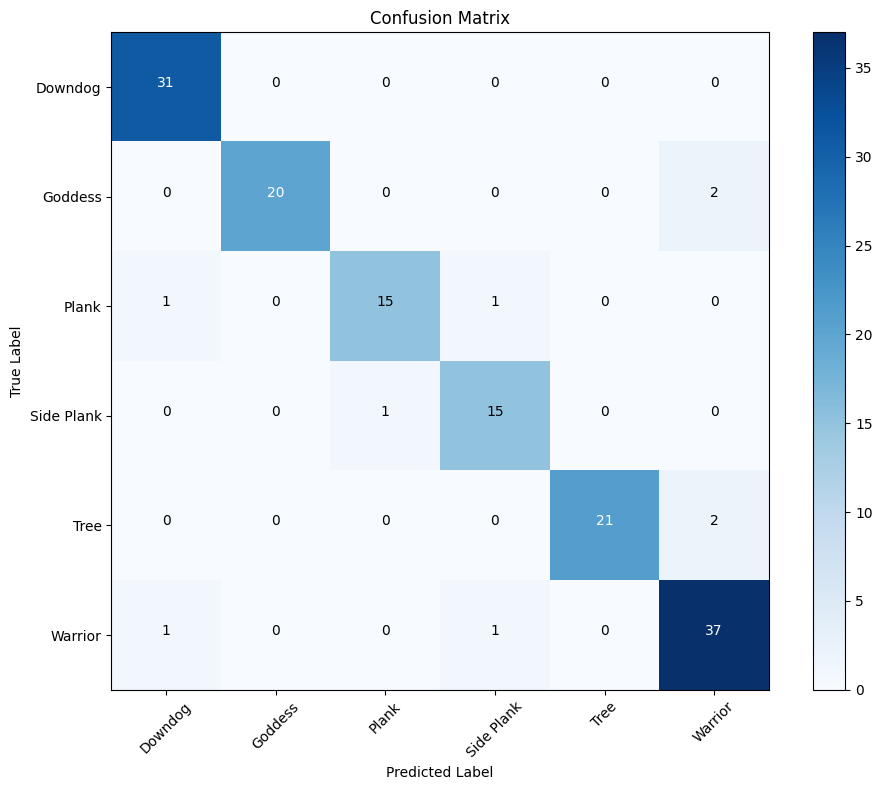

Classification Accuracy: 93.92%

Classification Report:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97        31
           1       1.00      0.91      0.95        22
           2       0.94      0.88      0.91        17
           3       0.88      0.94      0.91        16
           4       1.00      0.91      0.95        23
           5       0.90      0.95      0.92        39

    accuracy                           0.94       148
   macro avg       0.94      0.93      0.94       148
weighted avg       0.94      0.94      0.94       148



In [3]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import itertools

def load_landmark_data(file_path):
    # Load the saved landmark data
    with open(file_path, 'rb') as f:
        return pickle.load(f)

def prepare_data(landmark_dict):
    # Convert landmark dictionary to numpy arrays
    data = []
    labels = []
    for img_path, landmarks in landmark_dict.items():
        data.append(np.array(landmarks).flatten())
        labels.append(img_path.split("/")[-2])
    return np.asarray(data), np.asarray(labels)

def split_data(data, labels, test_size=0.2):
    # Split data into training and testing sets
    return train_test_split(data, labels, test_size=test_size, shuffle=True, stratify=labels)

def tune_classifier(x_train, y_train):
    # Define hyperparameters for grid search
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    rf = RandomForestClassifier(random_state=42)

    # Perform grid search to find best hyperparameters
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                               cv=3, n_jobs=-1, verbose=2, scoring='accuracy')
    grid_search.fit(x_train, y_train)
    print("Best parameters found: ", grid_search.best_params_)
    print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))
    return grid_search.best_estimator_

def evaluate_classifier(model, x_test, y_test):
    # Evaluate the classifier and return metrics
    y_predict = model.predict(x_test)
    accuracy = accuracy_score(y_predict, y_test)
    report = classification_report(y_test, y_predict)
    matrix = confusion_matrix(y_test, y_predict)
    return accuracy, report, matrix

def plot_confusion_matrix(matrix, labels, title='Confusion Matrix'):
    # Plot the confusion matrix
    plt.figure(figsize=(10, 8))
    plt.imshow(matrix, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(labels))
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)

    thresh = matrix.max() / 2.
    for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
        plt.text(j, i, format(matrix[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if matrix[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()

def display_metrics(matrix, labels, accuracy, report):
    # Display evaluation metrics
    plt.figure(figsize=(10,5))
    plot_confusion_matrix(matrix, labels)
    plt.show()
    print(f"Classification Accuracy: {accuracy*100:.2f}%")
    print("\nClassification Report:\n", report)

def save_classifier(model, file_path):
    # Save the trained classifier
    with open(file_path, 'wb') as f:
        pickle.dump({'model': model}, f)

# Main execution
try:
    landmark_dict = load_landmark_data('/kaggle/working/pose_landmarks.pkl')
    data, labels = prepare_data(landmark_dict)
    label_encoder = LabelEncoder()
    labels_encoded = label_encoder.fit_transform(labels)
    class_names = label_encoder.classes_
    x_train, x_test, y_train, y_test = split_data(data, labels_encoded)

    best_classifier = tune_classifier(x_train, y_train)
    accuracy, report, matrix = evaluate_classifier(best_classifier, x_test, y_test)
    display_metrics(matrix, class_names, accuracy, report)
    save_classifier(best_classifier, '/kaggle/working/pose_classifier.p')

except Exception as e:
    print("An error occurred:", str(e))

**Step 3 - Testing**


Predicting pose for image: 00000031.jpg


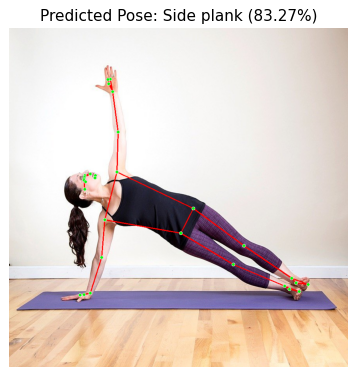


Predicting pose for image: 00000095.jpg


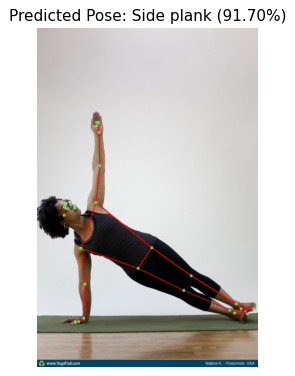


Predicting pose for image: 00000112.jpg


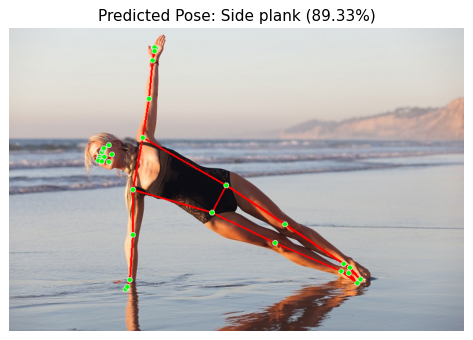


Predicting pose for image: 00000123.jpg


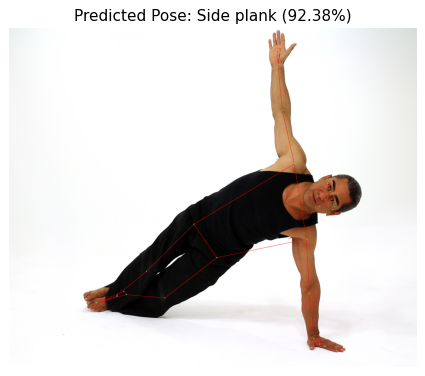


Predicting pose for image: 00000099.jpg


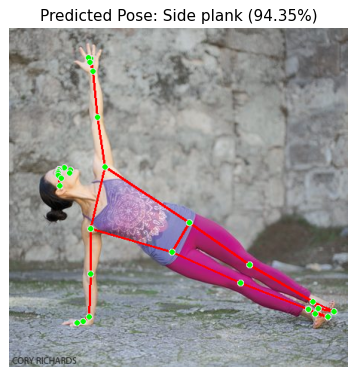


Predicting pose for image: 00000077.jpg


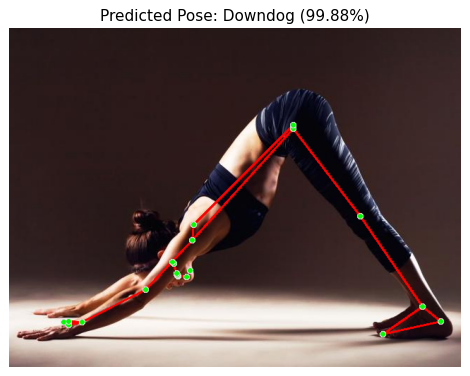


Predicting pose for image: 00000026.jpg


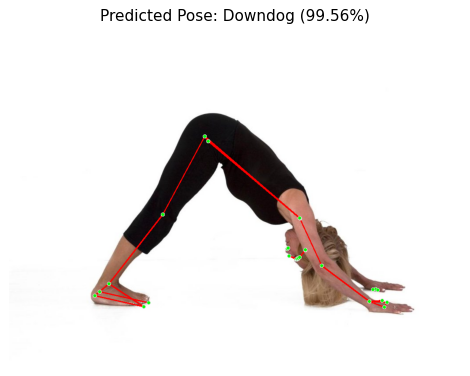


Predicting pose for image: 00000095.jpg


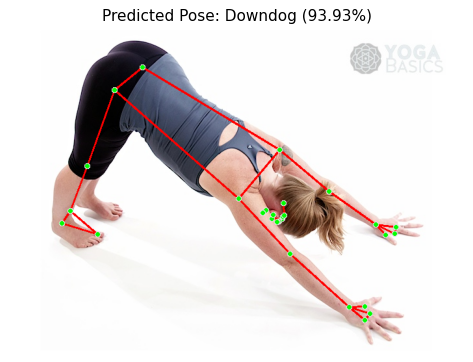


Predicting pose for image: 00000058.jpg


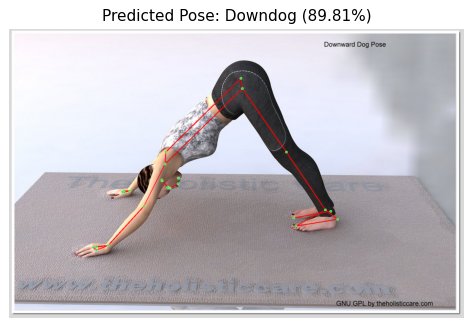


Predicting pose for image: 00000092.jpg


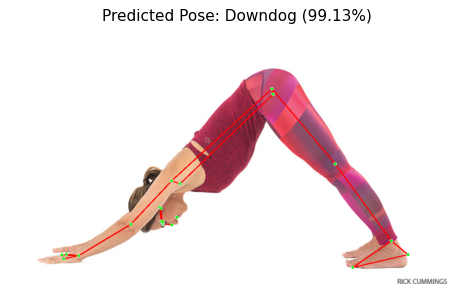


Predicting pose for image: 00000060.jpg


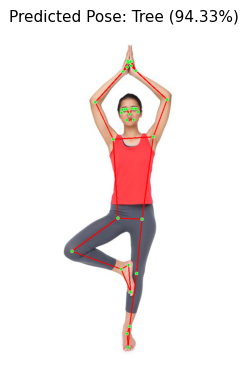


Predicting pose for image: 00000025.jpg


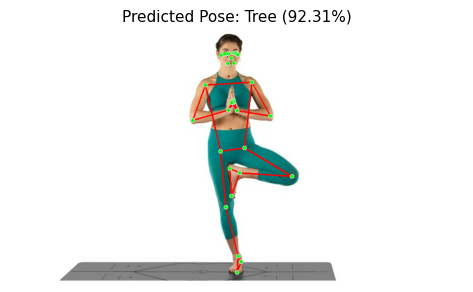


Predicting pose for image: 00000069.jpg


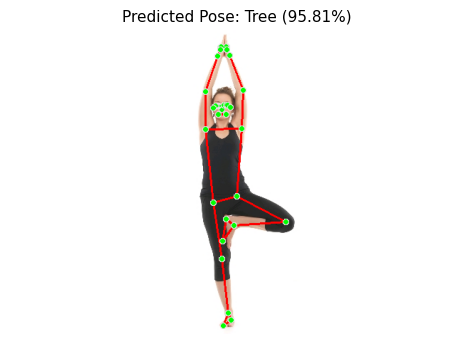


Predicting pose for image: 00000011.jpg


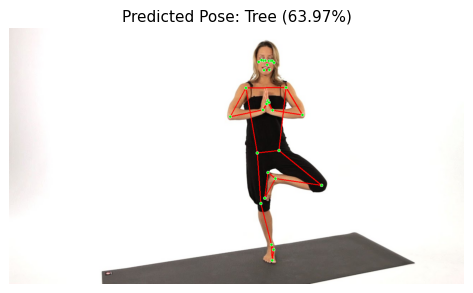


Predicting pose for image: 00000058.jpg


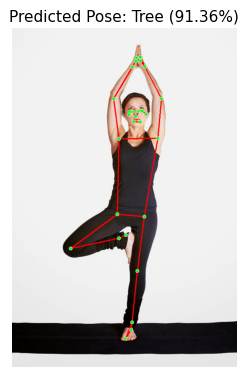


Predicting pose for image: 00000010.jpg


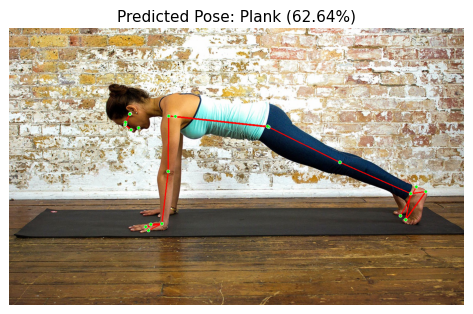


Predicting pose for image: 00000078.jpg


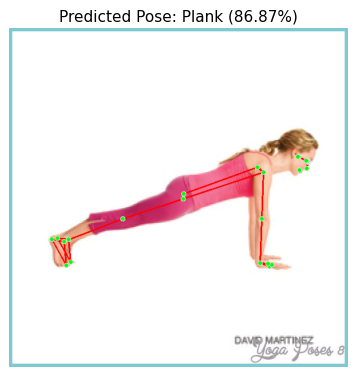


Predicting pose for image: 00000068.jpg


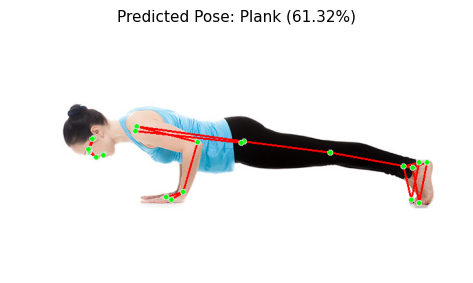


Predicting pose for image: 00000018.jpg


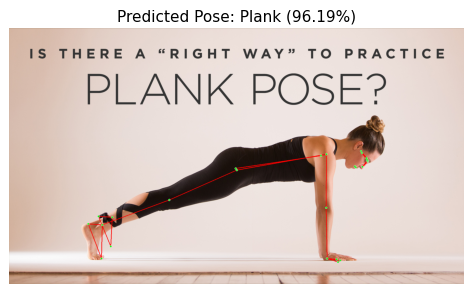


Predicting pose for image: 00000016.jpg


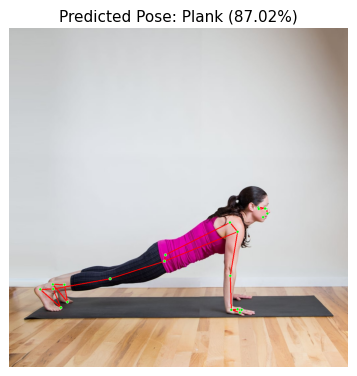


Predicting pose for image: 00000041.jpg


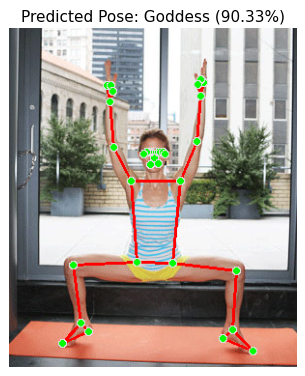


Predicting pose for image: 00000060.jpg


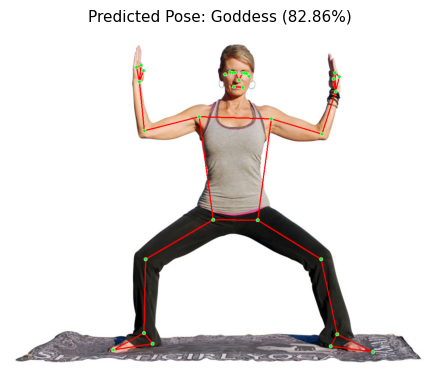


Predicting pose for image: 00000000.jpg


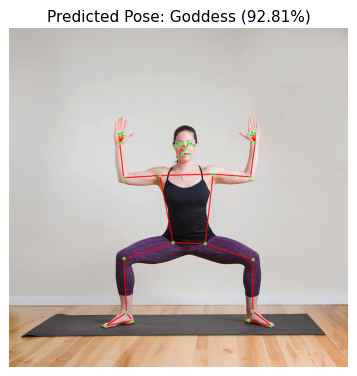


Predicting pose for image: 00000068.jpg


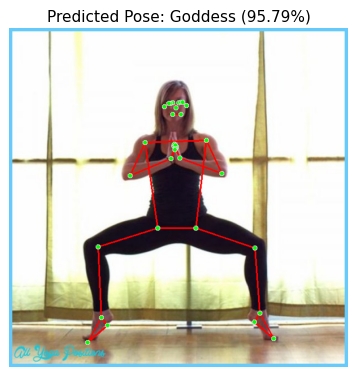


Predicting pose for image: 00000049.jpg


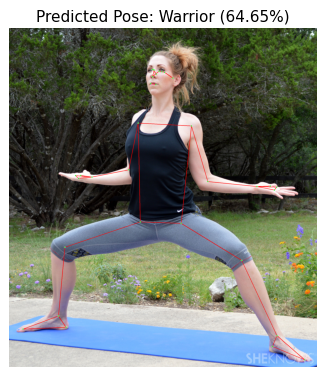


Predicting pose for image: 00000065.jpg


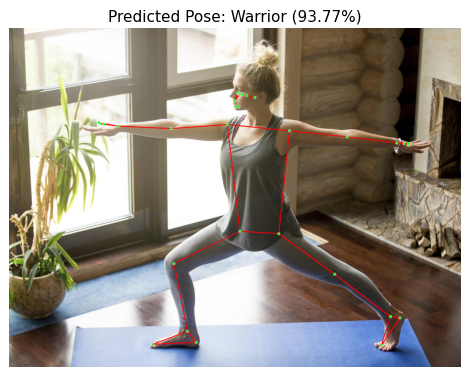


Predicting pose for image: 00000018.jpg


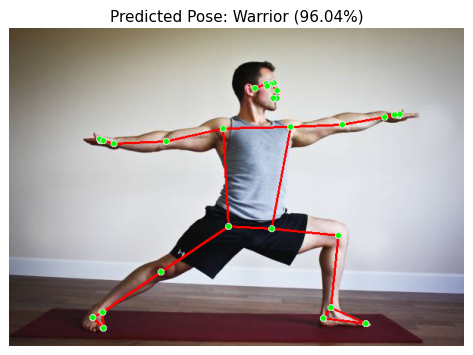


Predicting pose for image: 00000031.jpg


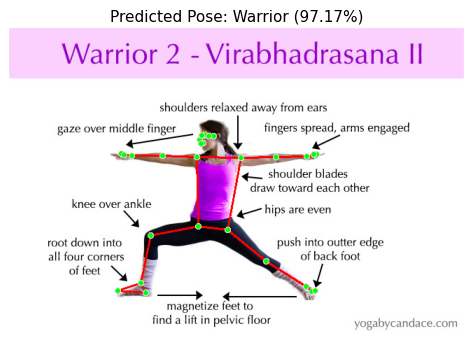


Predicting pose for image: 00000036.jpg


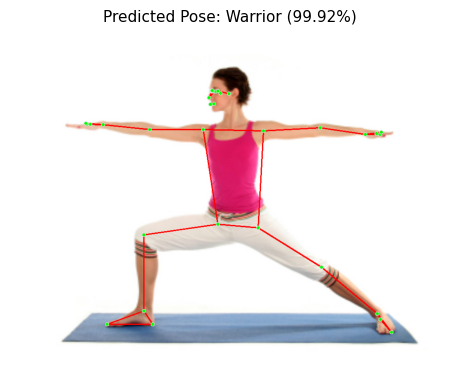


Predicting pose for image: 00000010.jpg


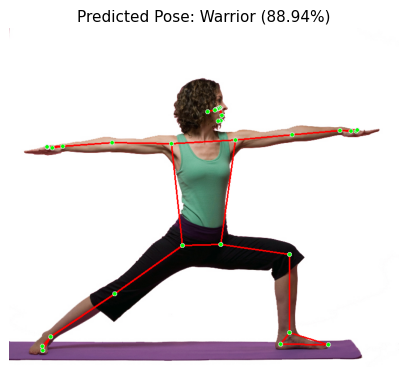

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import cv2
import os
import mediapipe as mp
import random
import warnings

# Ignore warnings
warnings.filterwarnings("ignore", category=UserWarning, module="google.protobuf.symbol_database")

def load_classifier():
    # Load the trained classifier
    with open('/kaggle/working/pose_classifier.p', 'rb') as f:
        model_data = pickle.load(f)
    return model_data['model']

def initialize_pose_detector():
    # Initialize the MediaPipe pose detector
    return mp.solutions.pose.Pose(static_image_mode=True)

def predict_pose(img_path, classifier, pose_detector, class_names):
    # Predict pose for a given image
    img = cv2.imread(img_path)
    results = pose_detector.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

    if not results.pose_landmarks:
        print(f"No pose detected in {img_path}.")
        return

    img_with_pose = img.copy()

    # Extract landmark data
    landmark_data = []
    for landmark in results.pose_landmarks.landmark:
        x, y = int(landmark.x * img.shape[1]), int(landmark.y * img.shape[0])
        landmark_data.extend([landmark.x, landmark.y, landmark.z])

    # Make prediction
    prediction_index = classifier.predict([landmark_data])[0]
    predicted_class = class_names[prediction_index]
    confidence = np.max(classifier.predict_proba([landmark_data]))

    draw_landmarks(img_with_pose, results.pose_landmarks)
    display_prediction(img_with_pose, predicted_class, confidence)

def draw_landmarks(img, landmarks):
    # Draw pose landmarks on the image
    mp_drawing = mp.solutions.drawing_utils
    mp_pose = mp.solutions.pose

    mp_drawing.draw_landmarks(
        img,
        landmarks,
        mp_pose.POSE_CONNECTIONS,
        mp_drawing.DrawingSpec(color=(0, 255, 0), thickness=2, circle_radius=2),
        mp_drawing.DrawingSpec(color=(0, 0, 255), thickness=2, circle_radius=2)
    )

def display_prediction(img_with_pose, predicted_class, confidence):
    # Display the image with prediction results
    dpi = 550 / 6
    plt.figure(dpi=dpi)
    plt.imshow(cv2.cvtColor(img_with_pose, cv2.COLOR_BGR2RGB))
    plt.title(f"Predicted Pose: {predicted_class.capitalize()} ({confidence*100:.2f}%)")
    plt.axis('off')
    plt.show()

# Main execution
classifier = load_classifier()
pose_detector = initialize_pose_detector()
class_names = ['downdog', 'goddess', 'plank', 'side plank', 'tree', 'warrior']

test_dataset = '/kaggle/input/yoga-dataset/DATASET/TEST'

for class_name in os.listdir(test_dataset):
    class_dir = os.path.join(test_dataset, class_name)
    images = os.listdir(class_dir)
    
    # Randomly select 5 images from each folder in test directory
    selected_images = random.sample(images, min(5, len(images)))
    
    for image in selected_images:
        image_path = os.path.join(class_dir, image)
        print(f"\nPredicting pose for image: {image}")
        predict_pose(image_path, classifier, pose_detector, class_names)

In [5]:
!wget -O pose_landmarker.task -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_heavy/float16/1/pose_landmarker_heavy.task

In [6]:
# STEP 1: Import the necessary modules.
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision
from mediapipe.framework.formats import landmark_pb2
import cv2
import numpy as np

# STEP 2: Create an PoseLandmarker object.
base_options = python.BaseOptions(model_asset_path='/kaggle/working/pose_landmarker.task')
options = vision.PoseLandmarkerOptions(
    base_options=base_options,
    output_segmentation_masks=True)
detector = vision.PoseLandmarker.create_from_options(options)

# STEP 3: Load the input image.
image = mp.Image.create_from_file("/kaggle/input/downdog1/Downdog1.jpeg")

# STEP 4: Detect pose landmarks from the input image.
detection_result = detector.detect(image)

In [7]:
detection_result.pose_landmarks[0]

[NormalizedLandmark(x=0.22611108422279358, y=0.6920079588890076, z=0.06241634115576744, visibility=0.9990854263305664, presence=0.9995266199111938),
 NormalizedLandmark(x=0.20032405853271484, y=0.6926528811454773, z=0.007294210139662027, visibility=0.9966532588005066, presence=0.9990345239639282),
 NormalizedLandmark(x=0.19632497429847717, y=0.6898730993270874, z=0.007066883146762848, visibility=0.9969499707221985, presence=0.9990191459655762),
 NormalizedLandmark(x=0.19328132271766663, y=0.6871751546859741, z=0.007268154062330723, visibility=0.9962326884269714, presence=0.9986159801483154),
 NormalizedLandmark(x=0.2012104094028473, y=0.6945123076438904, z=0.07232072204351425, visibility=0.9984099864959717, presence=0.9993054866790771),
 NormalizedLandmark(x=0.198684960603714, y=0.6932678818702698, z=0.07155612856149673, visibility=0.999061644077301, presence=0.9995495676994324),
 NormalizedLandmark(x=0.19574153423309326, y=0.6918940544128418, z=0.07105901837348938, visibility=0.999447

In [8]:
def process_and_extract_keypoints(image_path):
    try:
        image = mp.Image.create_from_file(image_path)
        results = detector.detect(image)
        keypoints = extract_keypoints(results)
        return keypoints
    except RuntimeError as e:
        print(f"Error processing image {image_path}: {e}")
        return None

# Function to extract keypoints
def extract_keypoints(results):
    if results.pose_landmarks:
        return [
            landmark_pb2.NormalizedLandmark(
                x=landmark.x, y=landmark.y, z=landmark.z
            )
            for landmark in results.pose_landmarks[0]
        ]
    return []

# Function to calculate angle between three points
def calculate_angle(a, b, c):
    a = np.array([a.x, a.y, a.z])
    b = np.array([b.x, b.y, b.z])
    c = np.array([c.x, c.y, c.z])
    ba = a - b
    bc = c - b
    cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
    angle = np.arccos(cosine_angle)
    angle_degrees = np.degrees(angle)
    
    return angle_degrees

# Function to calculate angles for key body parts
def calculate_angles(keypoints):
    angles = []
    if keypoints:
        left_elbow_angle = calculate_angle(keypoints[11], keypoints[13], keypoints[15])
        right_elbow_angle = calculate_angle(keypoints[12], keypoints[14], keypoints[16])
        left_shoulder_angle = calculate_angle(keypoints[23], keypoints[11], keypoints[13])
        right_shoulder_angle = calculate_angle(keypoints[24], keypoints[12], keypoints[14])
        left_hip_angle = calculate_angle(keypoints[25], keypoints[23], keypoints[11])
        right_hip_angle = calculate_angle(keypoints[26], keypoints[24], keypoints[12])
        left_knee_angle = calculate_angle(keypoints[23], keypoints[25], keypoints[27])
        right_knee_angle = calculate_angle(keypoints[24], keypoints[26], keypoints[28])
        angles = [
            left_elbow_angle, right_elbow_angle, left_shoulder_angle, right_shoulder_angle,
            left_hip_angle, right_hip_angle, left_knee_angle, right_knee_angle
        ]
    return angles

# Function to calculate the adjustment needed for each angle
def calculate_adjustments(correct_angles, user_angles):
    correct_angles = np.array([angle for angle in correct_angles], dtype=float)
    user_angles = np.array([angle for angle in user_angles], dtype=float)
    return correct_angles - user_angles

In [9]:
# test calculate angles
# Load and process both images
correct_keypoints = process_and_extract_keypoints('/kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000128.jpg')
user_keypoints = process_and_extract_keypoints('/kaggle/input/downdog1/Downdog1.jpeg')
# user_pose_results, user_pose_image = process_pose('/kaggle/input/yoga-posture-dataset/Anjaneyasana/File10.png')

# Calculate angles for both posese
correct_angles = calculate_angles(correct_keypoints)
user_angles = calculate_angles(user_keypoints)

In [10]:
correct_angles

[127.97746440057814,
 106.86354957637,
 150.86253509369521,
 166.8143662531626,
 67.49946499518592,
 54.944826080947955,
 172.4301010851608,
 156.08790144475404]

In [11]:
user_angles

[123.73228071124008,
 124.35743000803365,
 84.583834789731,
 85.40656752651114,
 78.53772010350487,
 80.97711630622737,
 63.691099142380956,
 56.20191588873117]

In [12]:
def calculate_percentage(adjustments, lower_threshold=10.0, upper_threshold=50.0):
    angular_distances = np.abs(adjustments)
    
    # Initialize correctness_percentages to 0
    correctness_percentages = np.zeros_like(angular_distances)
    
    # Case when angular_distances are less than or equal to lower_threshold
    below_lower_threshold = angular_distances <= lower_threshold
    correctness_percentages[below_lower_threshold] = 100
    
    # Case when angular_distances are between lower_threshold and upper_threshold
    between_thresholds = (angular_distances > lower_threshold) & (angular_distances < upper_threshold)
    correctness_percentages[between_thresholds] = 100 * (1 - (angular_distances[between_thresholds] - lower_threshold) / (upper_threshold - lower_threshold))
    
    # No need to explicitly set the values for angular_distances >= upper_threshold as they are already 0
    
    # Calculate overall correctness percentage
    overall_correctness_percentage = np.mean(correctness_percentages)
    
    return overall_correctness_percentage

In [13]:
# Mapping of angles to body parts
body_parts = [
    "Left Elbow", "Right Elbow", "Left Shoulder", "Right Shoulder", 
    "Left Hip", "Right Hip", "Left Knee", "Right Knee"
]

# Function to provide directional feedback based on model predictions
def provide_specific_feedback(correct_pose_angles, user_pose_angles, model, threshold=5.0):
    user_pose_angles = np.array([user_pose_angles])
    correct_pose_angles = np.array([correct_pose_angles])
    
    print(calculate_adjustments(user_pose_angles,correct_pose_angles))
#     adjustments = model.predict(calculate_adjustments(user_pose_angles,correct_pose_angles))
    adjustments = calculate_adjustments(user_pose_angles,correct_pose_angles)

    print(adjustments)
    
    score=calculate_percentage(adjustments)
    feedback = []
    for idx, (correct_angle, user_angle, adjustment) in enumerate(zip(correct_pose_angles[0], user_pose_angles[0], adjustments[0])):
        body_part = body_parts[idx]
        if abs(adjustment) < threshold:
            feedback.append(f"{body_part}: Good alignment!")
        else:
            direction = "decrease" if adjustment > 0 else "increase"
            detailed_direction = ""
            if body_part in ["Left Elbow", "Right Elbow"]:
                if direction == "increase":
                    detailed_direction = "Lift your arm higher."
                else:
                    detailed_direction = "Lower your arm."
            elif body_part in ["Left Shoulder", "Right Shoulder"]:
                if direction == "increase":
                    detailed_direction = "Move your shoulder up."
                else:
                    detailed_direction = "Move your shoulder down."
            elif body_part in ["Left Hip", "Right Hip"]:
                if direction == "increase":
                    detailed_direction = "Lift your hip higher."
                else:
                    detailed_direction = "Lower your hip."
            elif body_part in ["Left Knee", "Right Knee"]:
                if direction == "increase":
                    detailed_direction = "Lift your knee higher."
                else:
                    detailed_direction = "Lower your knee."
            
            feedback.append(f"{body_part}: Your angle is {user_angle:.2f}. Adjust by {abs(adjustment):.2f} degrees to {direction}. {detailed_direction}")
            
    return feedback,score

In [14]:
# Function to calculate the correctness percentage of a user's pose
def calculate_correctness_percentage(correct_angles, user_angles, lower_threshold=10.0, upper_threshold=50.0):
    correct_angles = np.array(correct_angles)
    user_angles = np.array(user_angles)
    
    # Calculate angular distances between correct and user angles
    angular_distances = np.abs(calculate_adjustments(correct_angles , user_angles))
    # Initialize correctness_percentages to 0
    correctness_percentages = np.zeros_like(angular_distances)
    
    # Case when angular_distances are less than or equal to lower_threshold
    below_lower_threshold = angular_distances <= lower_threshold
    correctness_percentages[below_lower_threshold] = 100
    
    # Case when angular_distances are between lower_threshold and upper_threshold
    between_thresholds = (angular_distances > lower_threshold) & (angular_distances < upper_threshold)
    correctness_percentages[between_thresholds] = 100 * (1 - (angular_distances[between_thresholds] - lower_threshold) / (upper_threshold - lower_threshold))
    
    # No need to explicitly set the values for angular_distances >= upper_threshold as they are already 0
    
    # Calculate overall correctness percentage
    overall_correctness_percentage = np.mean(correctness_percentages)
    
    return overall_correctness_percentage

In [15]:
# test calculate angles
# Load and process both images
correct_keypoints = process_and_extract_keypoints('/kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000128.jpg')
# user_keypoints = process_and_extract_keypoints('/kaggle/input/yoga-posture-dataset/Adho Mukha Svanasana/File21.png')
user_keypoints =  process_and_extract_keypoints('/kaggle/input/downdog1/Downdog1.jpeg')

# Calculate angles for both poses
new_correct_pose_angles = calculate_angles(correct_keypoints)

new_user_pose_angles = calculate_angles(user_keypoints)
regressor=0
feedback,score = provide_specific_feedback(new_correct_pose_angles, new_user_pose_angles, regressor)
for message in feedback:
    print(message)

print(f"Overall Pose Correctness Predict By Model: {score:.2f}%")
overall_correctness_percentage = calculate_correctness_percentage(new_correct_pose_angles, new_user_pose_angles)
print(f"Overall Pose Correctness: {overall_correctness_percentage:.2f}%")

[[  -4.24518369   17.49388043  -66.2787003   -81.40779873   11.03825511
    26.03229023 -108.73900194  -99.88598556]]
[[  -4.24518369   17.49388043  -66.2787003   -81.40779873   11.03825511
    26.03229023 -108.73900194  -99.88598556]]
Left Elbow: Good alignment!
Right Elbow: Your angle is 124.36. Adjust by 17.49 degrees to decrease. Lower your arm.
Left Shoulder: Your angle is 84.58. Adjust by 66.28 degrees to increase. Move your shoulder up.
Right Shoulder: Your angle is 85.41. Adjust by 81.41 degrees to increase. Move your shoulder up.
Left Hip: Your angle is 78.54. Adjust by 11.04 degrees to decrease. Lower your hip.
Right Hip: Your angle is 80.98. Adjust by 26.03 degrees to decrease. Lower your hip.
Left Knee: Your angle is 63.69. Adjust by 108.74 degrees to increase. Lift your knee higher.
Right Knee: Your angle is 56.20. Adjust by 99.89 degrees to increase. Lift your knee higher.
Overall Pose Correctness Predict By Model: 42.32%
Overall Pose Correctness: 42.32%


In [16]:
def visualize_corrections(image_path, keypoints, feedback_list):
    import cv2
    from matplotlib import pyplot as plt

    img = cv2.imread(image_path)
    h, w, _ = img.shape

    # Map feedback to landmark index
    feedback_mapping = {
        "Left Elbow": 13,
        "Right Elbow": 14,
        "Left Shoulder": 11,
        "Right Shoulder": 12,
        "Left Hip": 23,
        "Right Hip": 24,
        "Left Knee": 25,
        "Right Knee": 26
    }

    # Process feedback and draw
    for feedback in feedback_list:
        body_part = feedback.split(":")[0]
        feedback_text = feedback.split(":")[1].strip()
        idx = feedback_mapping.get(body_part, None)

        if idx is not None and idx < len(keypoints):
            kp = keypoints[idx]
            x = int(kp.x * w)
            y = int(kp.y * h)

            # Color: green = good, red = correction needed
            color = (0, 255, 0) if "Good" in feedback_text else (0, 0, 255)

            # Draw circle
            cv2.circle(img, (x, y), 8, color, -1)

            # Draw feedback text
            cv2.putText(img, feedback_text, (x + 10, y - 10), cv2.FONT_HERSHEY_SIMPLEX,
                        0.5, color, 2, cv2.LINE_AA)

    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Display using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title("Pose Correction Feedback")
    plt.show()


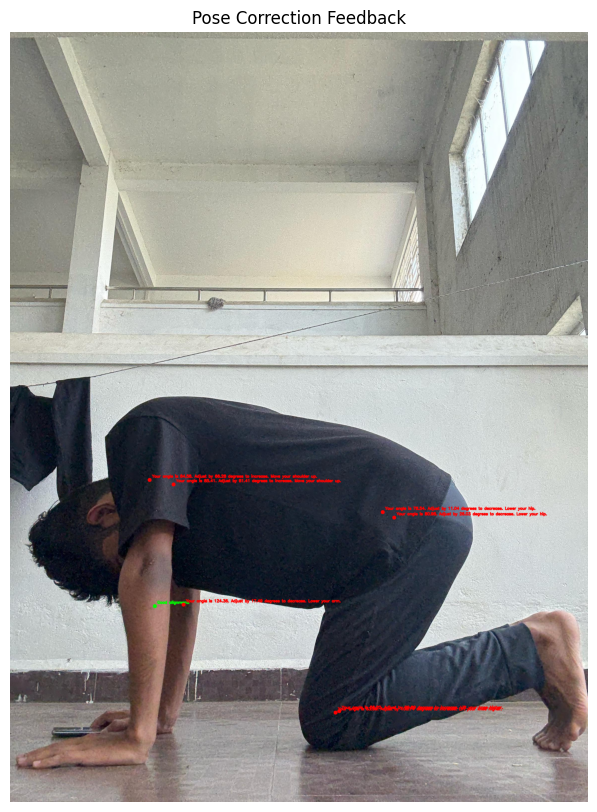

In [17]:
visualize_corrections(
    '/kaggle/input/downdog1/Downdog1.jpeg',
    user_keypoints,
    feedback
)


In [18]:
def visualize_comparison(correct_image_path, correct_kps, user_image_path, user_kps, feedback_list):
    import cv2
    import numpy as np
    from matplotlib import pyplot as plt

    # Load and resize both images to the same height
    correct_img = cv2.imread(correct_image_path)
    user_img = cv2.imread(user_image_path)

    # Resize both to same height
    target_height = 600
    correct_ratio = target_height / correct_img.shape[0]
    user_ratio = target_height / user_img.shape[0]

    correct_img = cv2.resize(correct_img, (int(correct_img.shape[1] * correct_ratio), target_height))
    user_img = cv2.resize(user_img, (int(user_img.shape[1] * user_ratio), target_height))

    # Convert grayscale to 3-channel if needed
    if len(correct_img.shape) == 2:
        correct_img = cv2.cvtColor(correct_img, cv2.COLOR_GRAY2BGR)
    if len(user_img.shape) == 2:
        user_img = cv2.cvtColor(user_img, cv2.COLOR_GRAY2BGR)

    # Helper function to draw pose angles and feedback
    def draw_pose(img, keypoints, feedback_dict=None, is_user=False):
        h, w, _ = img.shape

        def draw_angle_text(idx1, idx2, idx3, label=None, color=(255, 255, 255)):
            try:
                a = np.array([keypoints[idx1].x, keypoints[idx1].y]) * [w, h]
                b = np.array([keypoints[idx2].x, keypoints[idx2].y]) * [w, h]
                c = np.array([keypoints[idx3].x, keypoints[idx3].y]) * [w, h]

                ba = a - b
                bc = c - b
                cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
                angle = np.degrees(np.arccos(np.clip(cosine_angle, -1.0, 1.0)))

                pos = tuple(b.astype(int))
                label = label or f"{int(angle)}°"
                cv2.putText(img, f"{label}", (pos[0]+5, pos[1]-10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
                cv2.circle(img, pos, 6, color, -1)
            except Exception as e:
                pass

        joint_pairs = {
            "Left Elbow": (11, 13, 15),
            "Right Elbow": (12, 14, 16),
            "Left Shoulder": (23, 11, 13),
            "Right Shoulder": (24, 12, 14),
            "Left Hip": (25, 23, 11),
            "Right Hip": (26, 24, 12),
            "Left Knee": (23, 25, 27),
            "Right Knee": (24, 26, 28)
        }

        for part, (a, b, c) in joint_pairs.items():
            label = part
            color = (255, 255, 255)  # default white
            if is_user and feedback_dict and part in feedback_dict:
                label = feedback_dict[part]
                color = (0, 255, 0) if "Good" in label else (0, 0, 255)

            draw_angle_text(a, b, c, label=label, color=color)

    # Convert feedback to dictionary for quick lookup
    feedback_dict = {}
    for fb in feedback_list:
        if ":" in fb:
            part, msg = fb.split(":", 1)
            feedback_dict[part.strip()] = msg.strip()

    # Draw angles + feedback on both images
    draw_pose(correct_img, correct_kps, is_user=False)
    draw_pose(user_img, user_kps, feedback_dict, is_user=True)

    # Combine both images side by side
    combined = cv2.hconcat([correct_img, user_img])
    combined_rgb = cv2.cvtColor(combined, cv2.COLOR_BGR2RGB)

    # Show using matplotlib
    plt.figure(figsize=(18, 10))
    plt.imshow(combined_rgb)
    plt.axis('off')
    plt.title("Comparision")
    plt.show()


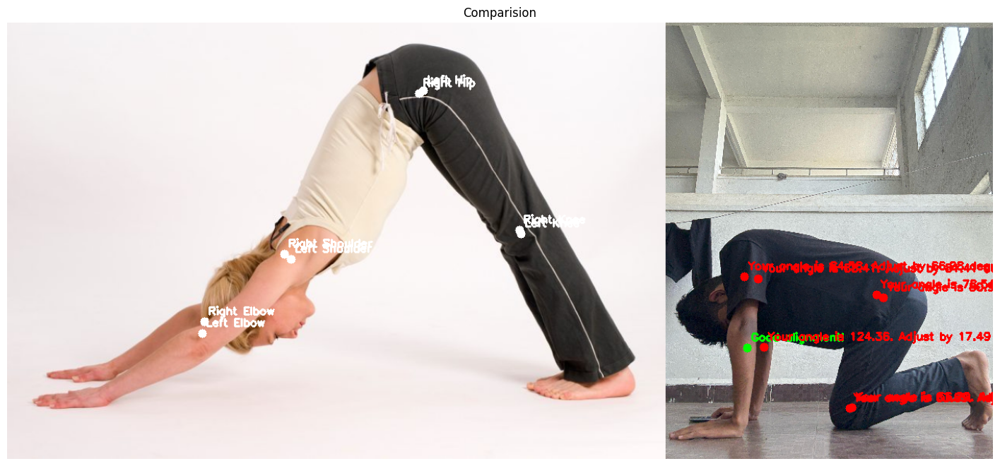

In [19]:
visualize_comparison(
    '/kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000128.jpg',  # Correct Pose
    correct_keypoints,
    '/kaggle/input/downdog1/Downdog1.jpeg',  # User Pose
    user_keypoints,
    feedback
)


In [20]:
def visualize_comparison_and_print_table(correct_image_path, correct_kps, user_image_path, user_kps, feedback_list):
    import cv2
    import numpy as np
    from matplotlib import pyplot as plt
    import pandas as pd

    # Joint label definitions
    joint_pairs = {
        "Left Elbow": (11, 13, 15),
        "Right Elbow": (12, 14, 16),
        "Left Shoulder": (23, 11, 13),
        "Right Shoulder": (24, 12, 14),
        "Left Hip": (25, 23, 11),
        "Right Hip": (26, 24, 12),
        "Left Knee": (23, 25, 27),
        "Right Knee": (24, 26, 28)
    }

    labels = list(joint_pairs.keys())
    index_mapping = {i + 1: part for i, part in enumerate(labels)}

    # Load and resize images
    correct_img = cv2.imread(correct_image_path)
    user_img = cv2.imread(user_image_path)

    target_height = 600
    correct_ratio = target_height / correct_img.shape[0]
    user_ratio = target_height / user_img.shape[0]

    correct_img = cv2.resize(correct_img, (int(correct_img.shape[1] * correct_ratio), target_height))
    user_img = cv2.resize(user_img, (int(user_img.shape[1] * user_ratio), target_height))

    # Ensure 3 channels
    if len(correct_img.shape) == 2:
        correct_img = cv2.cvtColor(correct_img, cv2.COLOR_GRAY2BGR)
    if len(user_img.shape) == 2:
        user_img = cv2.cvtColor(user_img, cv2.COLOR_GRAY2BGR)

    h1, w1, _ = correct_img.shape
    h2, w2, _ = user_img.shape

    # Stickman lines
    connections = [
        (11, 13), (13, 15), (12, 14), (14, 16),
        (11, 23), (12, 24), (23, 25), (25, 27),
        (24, 26), (26, 28), (23, 24), (11, 12)
    ]

    correct_angles = {}
    user_angles = {}
    table_data = []

    # Draw function
    def draw_pose(img, kps, angle_dict, img_width, offset_x=0, color=(0, 255, 0), is_user=False, label_color=(255, 255, 255), line_color=(200, 200, 200)):
        for start, end in connections:
            try:
                x1, y1 = int(kps[start].x * img_width) + offset_x, int(kps[start].y * img.shape[0])
                x2, y2 = int(kps[end].x * img_width) + offset_x, int(kps[end].y * img.shape[0])
                cv2.line(img, (x1, y1), (x2, y2), line_color, 2)
            except:
                continue

        for i, (part, (a, b, c)) in enumerate(joint_pairs.items(), start=1):
            try:
                pt_a = np.array([kps[a].x * img_width, kps[a].y * img.shape[0]])
                pt_b = np.array([kps[b].x * img_width, kps[b].y * img.shape[0]])
                pt_c = np.array([kps[c].x * img_width, kps[c].y * img.shape[0]])

                ba = pt_a - pt_b
                bc = pt_c - pt_b
                cosine_angle = np.dot(ba, bc) / (np.linalg.norm(ba) * np.linalg.norm(bc))
                angle = np.degrees(np.arccos(np.clip(cosine_angle, -1.0, 1.0)))

                point = (int(pt_b[0]) + offset_x, int(pt_b[1]))
                cv2.circle(img, point, 8, color, -1)
                label_pos = (point[0] - 10, point[1] + 25)
                cv2.putText(img, str(i), label_pos, cv2.FONT_HERSHEY_SIMPLEX, 0.6, label_color, 2)

                angle_dict[i] = angle
            except:
                continue

    # Draw on correct and user image separately
    draw_pose(correct_img, correct_kps, correct_angles, img_width=w1, offset_x=0, color=(0, 255, 0))
    draw_pose(user_img, user_kps, user_angles, img_width=w2, offset_x=0, color=(255, 0, 0))

    # Combine side by side
    combined = cv2.hconcat([correct_img, user_img])
    combined_rgb = cv2.cvtColor(combined, cv2.COLOR_BGR2RGB)

    # Show side-by-side result
    plt.figure(figsize=(18, 10))
    plt.imshow(combined_rgb)
    plt.axis('off')
    plt.title("Comparision")
    plt.show()

    # Build correction table
    for i in correct_angles:
        correct = correct_angles[i]
        user = user_angles.get(i)
        if user is not None:
            delta = user - correct
            direction = "↑ Increase" if delta < 0 else "↓ Decrease"
            table_data.append([
                i,
                index_mapping[i],
                f"{correct:.2f}",
                f"{user:.2f}",
                f"{abs(delta):.2f}° → {direction}"
            ])

    df = pd.DataFrame(table_data, columns=["Label", "Body Part", "Correct Angle", "User Angle", "Correction Needed"])
    display(df)


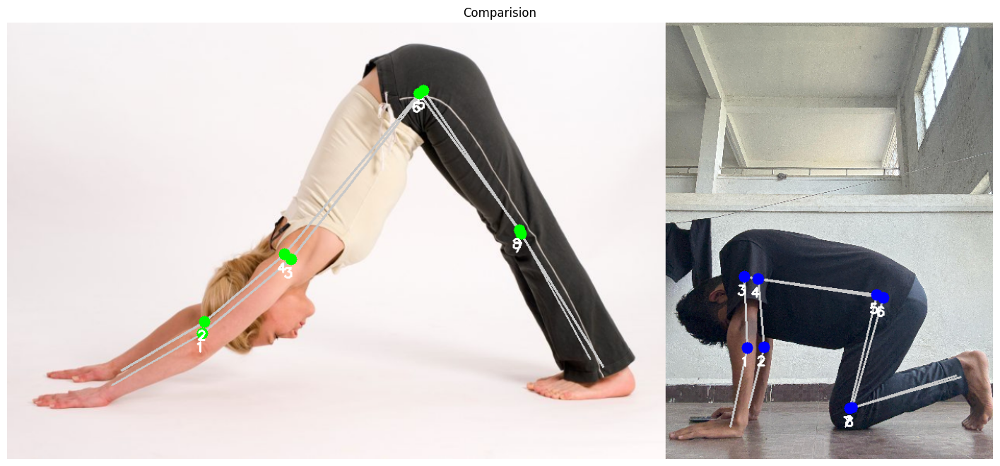

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,169.66,165.45,4.21° → ↑ Increase
1,2,Right Elbow,169.63,161.37,8.25° → ↑ Increase
2,3,Left Shoulder,168.13,79.80,88.32° → ↑ Increase
3,4,Right Shoulder,170.48,76.77,93.71° → ↑ Increase
4,5,Left Hip,72.31,84.63,12.32° → ↓ Decrease
5,6,Right Hip,76.03,82.70,6.67° → ↓ Decrease
6,7,Left Knee,177.32,60.93,116.39° → ↑ Increase
7,8,Right Knee,172.75,57.36,115.38° → ↑ Increase


In [21]:
visualize_comparison_and_print_table(
    '/kaggle/input/yoga-dataset/DATASET/TRAIN/Downdog/00000128.jpg',
    correct_keypoints,
    '/kaggle/input/downdog1/Downdog1.jpeg',
    user_keypoints,
    feedback
)


In [22]:
def process_pose_pairs_with_metrics(image_pairs):
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    all_joint_accuracies = []
    all_scores = []
    detailed_feedback_all = []

    for idx, pair in enumerate(image_pairs, start=1):
        print(f"\n🔁 Processing Pose Pair {idx}...")

        correct_path = pair["correct"]
        user_path = pair["user"]

        correct_kps = process_and_extract_keypoints(correct_path)
        user_kps = process_and_extract_keypoints(user_path)

        if correct_kps is None or user_kps is None:
            print(f"❌ Skipping Pair {idx}: Keypoints missing.")
            continue

        correct_angles = calculate_angles(correct_kps)
        user_angles = calculate_angles(user_kps)
        feedback, score = provide_specific_feedback(correct_angles, user_angles, model=0)

        print(f"🟢 Pose Accuracy: {score:.2f}%")

        all_scores.append(score)

        # Collect joint-wise accuracy
        joint_acc = []
        for correct, user in zip(correct_angles, user_angles):
            delta = abs(correct - user)
            acc = 100.0 if delta <= 10 else max(0.0, 100 * (1 - (delta - 10) / 40))  # same thresholds
            joint_acc.append(acc)
        all_joint_accuracies.append(joint_acc)

        # Save feedback with pair index
        detailed_feedback_all.append({
            "pair": idx,
            "feedback": feedback
        })

        # Show visual and table
        visualize_comparison_and_print_table(correct_path, correct_kps, user_path, user_kps, feedback)

    # Overall Accuracy
    avg_score = np.mean(all_scores)
    print(f"\n🔥 Average Pose Accuracy across all {len(all_scores)} pairs: {avg_score:.2f}%")

    # Create joint accuracy heatmap
    joint_names = [
        "Left Elbow", "Right Elbow", "Left Shoulder", "Right Shoulder",
        "Left Hip", "Right Hip", "Left Knee", "Right Knee"
    ]
    joint_acc_matrix = np.array(all_joint_accuracies)

    df_acc = pd.DataFrame(joint_acc_matrix, columns=joint_names)
    plt.figure(figsize=(12, 6))
    sns.heatmap(df_acc, annot=True, cmap="YlGnBu", fmt=".1f")
    plt.title("Joint-wise Accuracy (%) Across All Pairs")
    plt.xlabel("Joint")
    plt.ylabel("Image Pair")
    plt.show()

    return all_scores, detailed_feedback_all, df_acc



🔁 Processing Pose Pair 1...
[[-42.18438888 -23.55330507 -40.36082187 -48.4340831  -13.02224886
   17.75201507   4.45472171   2.57843777]]
[[-42.18438888 -23.55330507 -40.36082187 -48.4340831  -13.02224886
   17.75201507   4.45472171   2.57843777]]
🟢 Pose Accuracy: 60.84%


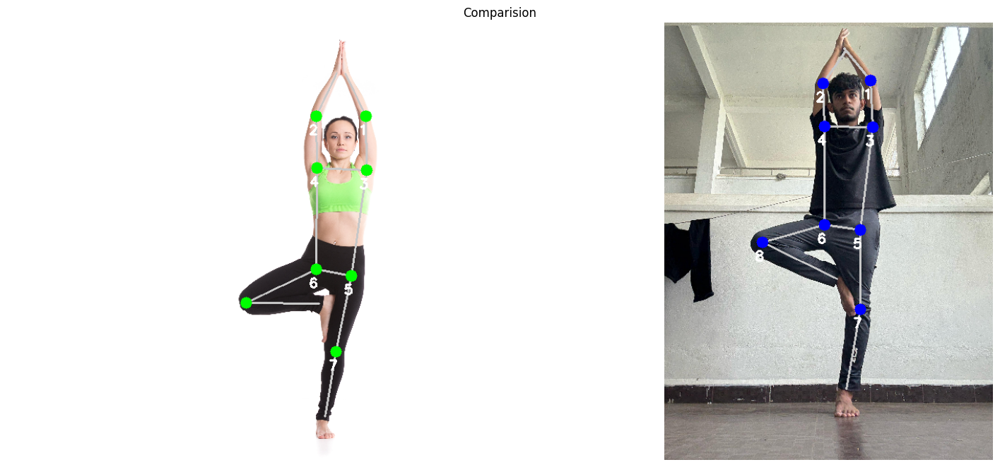

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,154.72,143.82,10.90° → ↑ Increase
1,2,Right Elbow,153.52,144.85,8.67° → ↑ Increase
2,3,Left Shoulder,171.22,170.58,0.64° → ↑ Increase
3,4,Right Shoulder,178.80,178.84,0.04° → ↓ Decrease
4,5,Left Hip,176.73,172.95,3.78° → ↑ Increase
5,6,Right Hip,116.33,106.16,10.17° → ↑ Increase
6,7,Left Knee,178.52,169.84,8.68° → ↑ Increase
7,8,Right Knee,25.97,42.15,16.17° → ↓ Decrease



🔁 Processing Pose Pair 2...
Error processing image /kaggle/input/trail/downdog1.jpeg: Image decoding failed (can't fopen): /kaggle/input/trail/downdog1.jpeg
❌ Skipping Pair 2: Keypoints missing.

🔁 Processing Pose Pair 3...
Error processing image /kaggle/input/trail/downdog2.jpeg: Image decoding failed (can't fopen): /kaggle/input/trail/downdog2.jpeg
❌ Skipping Pair 3: Keypoints missing.

🔁 Processing Pose Pair 4...
[[  4.68473608 -12.67892407 -41.62110365 -56.88923155  24.18623424
   23.58217499 -10.81451201 -20.60912   ]]
[[  4.68473608 -12.67892407 -41.62110365 -56.88923155  24.18623424
   23.58217499 -10.81451201 -20.60912   ]]
🟢 Pose Accuracy: 64.53%


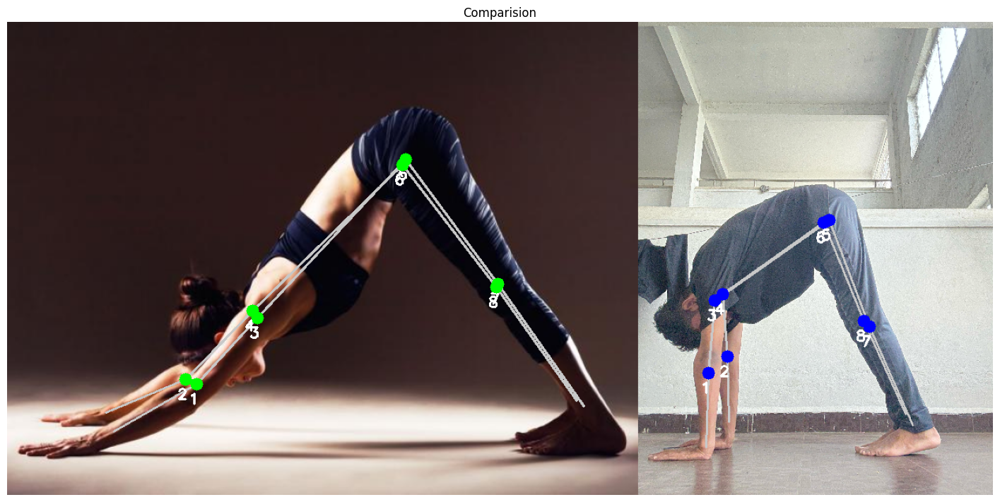

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,162.55,176.78,14.23° → ↓ Decrease
1,2,Right Elbow,157.15,177.02,19.86° → ↓ Decrease
2,3,Left Shoulder,179.52,130.43,49.08° → ↑ Increase
3,4,Right Shoulder,178.57,120.98,57.59° → ↑ Increase
4,5,Left Hip,79.51,75.62,3.88° → ↑ Increase
5,6,Right Hip,83.49,76.61,6.88° → ↑ Increase
6,7,Left Knee,178.79,177.07,1.71° → ↑ Increase
7,8,Right Knee,177.49,177.53,0.04° → ↓ Decrease



🔁 Processing Pose Pair 5...
[[  0.51053655   6.44949708 -57.09513226 -63.70051634 -19.95801672
   11.84420247 -16.85239943   2.51334354]]
[[  0.51053655   6.44949708 -57.09513226 -63.70051634 -19.95801672
   11.84420247 -16.85239943   2.51334354]]
🟢 Pose Accuracy: 69.17%


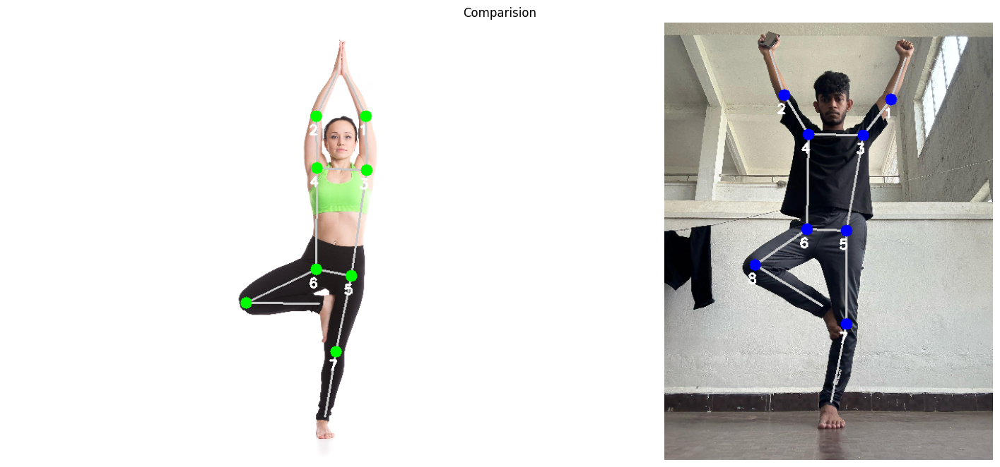

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,154.72,160.31,5.58° → ↓ Decrease
1,2,Right Elbow,153.52,166.86,13.33° → ↓ Decrease
2,3,Left Shoulder,171.22,151.73,19.49° → ↑ Increase
3,4,Right Shoulder,178.80,147.51,31.29° → ↑ Increase
4,5,Left Hip,176.73,169.64,7.09° → ↑ Increase
5,6,Right Hip,116.33,125.29,8.95° → ↓ Decrease
6,7,Left Knee,178.52,168.70,9.82° → ↑ Increase
7,8,Right Knee,25.97,65.77,39.80° → ↓ Decrease



🔁 Processing Pose Pair 6...
[[ 29.53515536  11.60672568  23.61695959  22.39467813 -21.09597397
  -26.79670382   7.53136884   6.15715071]]
[[ 29.53515536  11.60672568  23.61695959  22.39467813 -21.09597397
  -26.79670382   7.53136884   6.15715071]]
🟢 Pose Accuracy: 76.55%


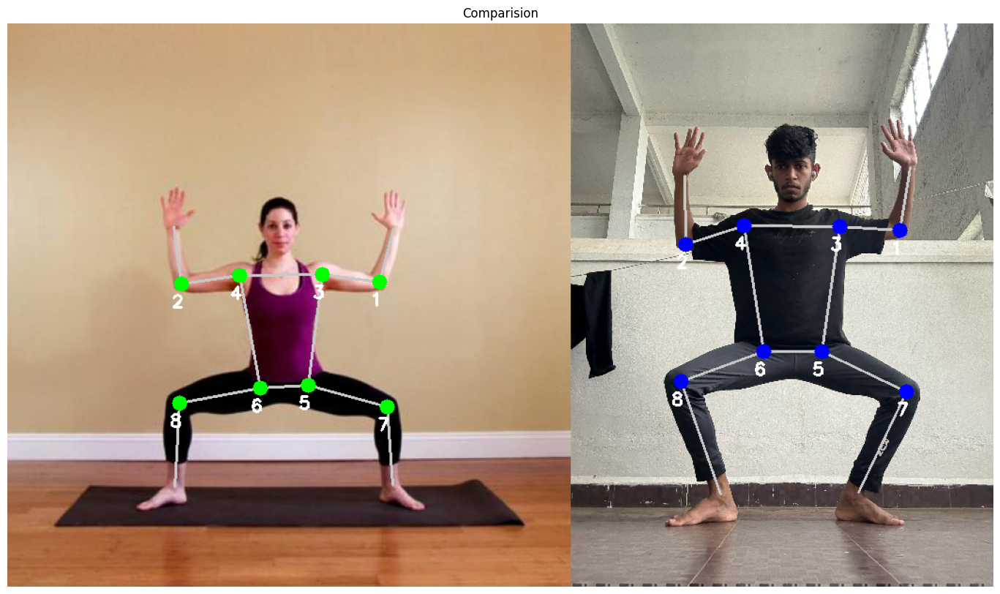

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,97.07,95.64,1.43° → ↑ Increase
1,2,Right Elbow,89.50,72.17,17.33° → ↑ Increase
2,3,Left Shoulder,90.06,94.87,4.82° → ↓ Decrease
3,4,Right Shoulder,92.26,80.60,11.66° → ↑ Increase
4,5,Left Hip,97.64,107.39,9.75° → ↓ Decrease
5,6,Right Hip,90.31,101.25,10.94° → ↓ Decrease
6,7,Left Knee,109.24,90.20,19.04° → ↑ Increase
7,8,Right Knee,103.52,91.15,12.37° → ↑ Increase



🔁 Processing Pose Pair 7...
[[ -5.74008018  -3.35766892  20.4832906   15.53966207 -14.59141938
  -14.28060954 -27.06361488 -22.77774858]]
[[ -5.74008018  -3.35766892  20.4832906   15.53966207 -14.59141938
  -14.28060954 -27.06361488 -22.77774858]]
🟢 Pose Accuracy: 82.89%


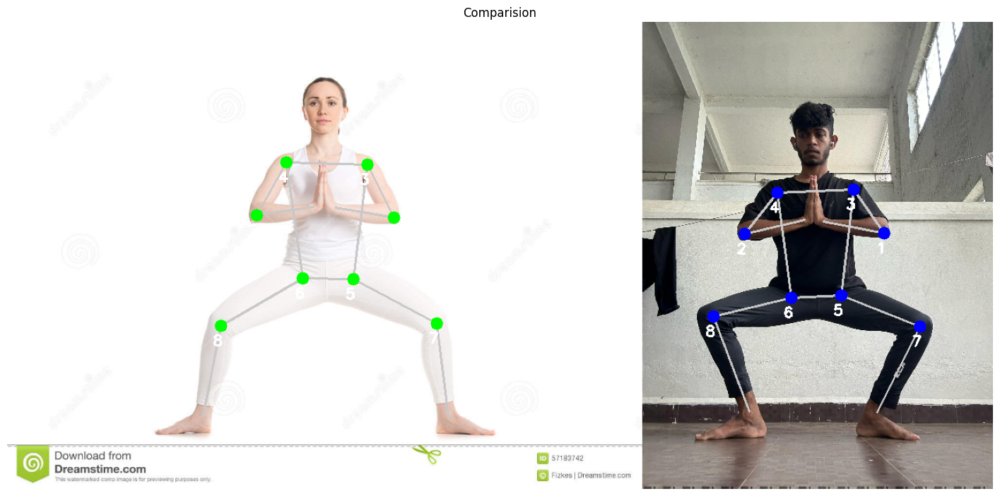

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,54.01,43.79,10.22° → ↑ Increase
1,2,Right Elbow,52.21,38.45,13.76° → ↑ Increase
2,3,Left Shoulder,33.39,42.06,8.67° → ↓ Decrease
3,4,Right Shoulder,37.33,45.95,8.62° → ↓ Decrease
4,5,Left Hip,110.84,104.86,5.98° → ↑ Increase
5,6,Right Hip,112.07,95.86,16.21° → ↑ Increase
6,7,Left Knee,125.03,84.73,40.30° → ↑ Increase
7,8,Right Knee,130.71,82.83,47.88° → ↑ Increase



🔁 Processing Pose Pair 8...
[[-31.43672907 -19.6981687   -2.16333709  17.11680635   8.17024773
   -2.36482125 -19.37910606  -1.59891226]]
[[-31.43672907 -19.6981687   -2.16333709  17.11680635   8.17024773
   -2.36482125 -19.37910606  -1.59891226]]
🟢 Pose Accuracy: 85.12%


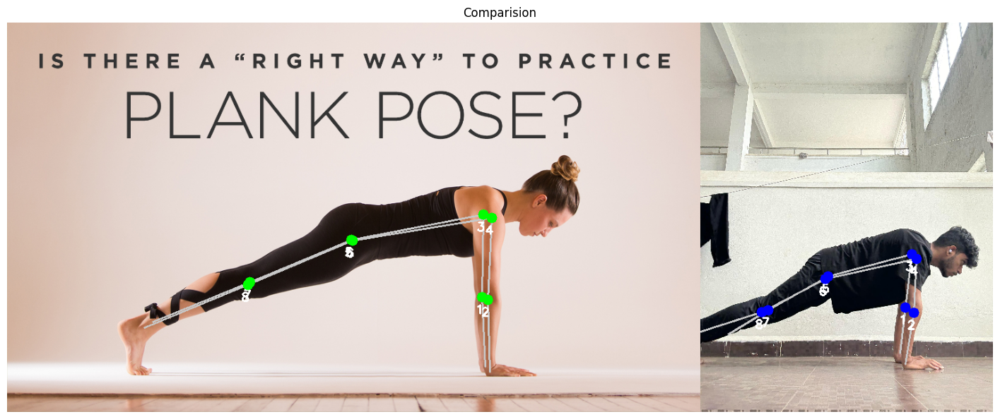

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,176.86,178.42,1.57° → ↓ Decrease
1,2,Right Elbow,175.11,172.97,2.14° → ↑ Increase
2,3,Left Shoulder,78.55,67.93,10.62° → ↑ Increase
3,4,Right Shoulder,77.50,74.81,2.68° → ↑ Increase
4,5,Left Hip,168.08,165.61,2.47° → ↑ Increase
5,6,Right Hip,166.68,165.29,1.39° → ↑ Increase
6,7,Left Knee,179.45,177.74,1.71° → ↑ Increase
7,8,Right Knee,179.72,170.33,9.40° → ↑ Increase



🔁 Processing Pose Pair 9...
[[-14.14497906 -10.61472601  13.17229403   4.75566006  26.87607881
   -0.0969358   -1.86771869 -13.69695597]]
[[-14.14497906 -10.61472601  13.17229403   4.75566006  26.87607881
   -0.0969358   -1.86771869 -13.69695597]]
🟢 Pose Accuracy: 91.09%


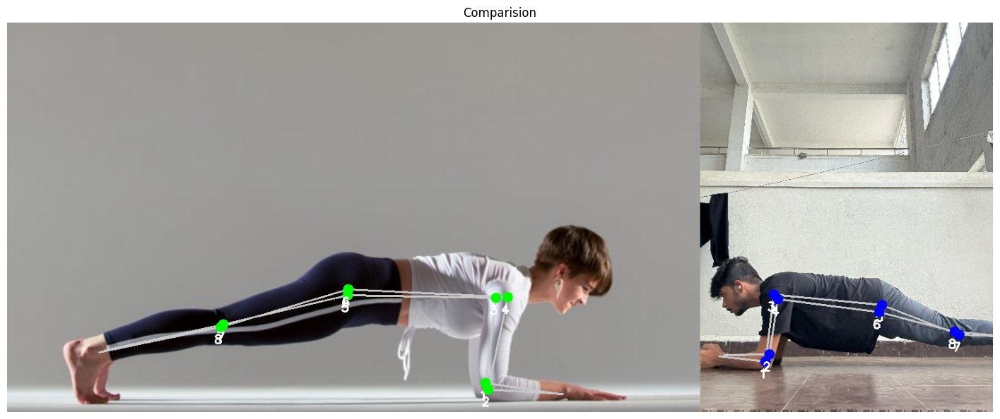

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,91.69,91.36,0.33° → ↑ Increase
1,2,Right Elbow,81.77,99.12,17.34° → ↓ Decrease
2,3,Left Shoulder,83.75,91.96,8.21° → ↓ Decrease
3,4,Right Shoulder,81.00,90.89,9.89° → ↓ Decrease
4,5,Left Hip,165.69,164.11,1.58° → ↑ Increase
5,6,Right Hip,160.84,172.86,12.02° → ↓ Decrease
6,7,Left Knee,179.04,160.49,18.55° → ↑ Increase
7,8,Right Knee,175.37,170.91,4.46° → ↑ Increase



🔁 Processing Pose Pair 10...
[[ -4.79679737  14.15630204  -4.6342404   25.24945152 -30.58841424
  -31.63392402 -15.2159133   -6.88876962]]
[[ -4.79679737  14.15630204  -4.6342404   25.24945152 -30.58841424
  -31.63392402 -15.2159133   -6.88876962]]
🟢 Pose Accuracy: 79.11%


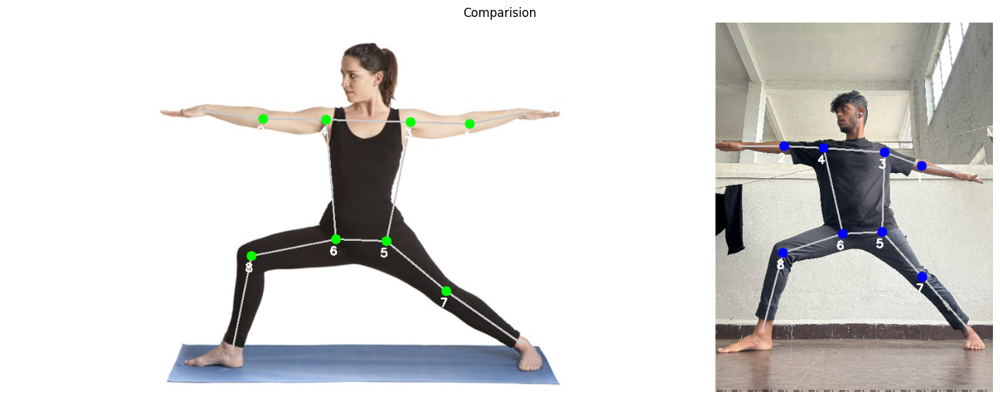

,Label,Body Part,Correct Angle,User Angle,Correction Needed
0,1,Left Elbow,166.09,169.62,3.54° → ↓ Decrease
1,2,Right Elbow,173.24,178.39,5.15° → ↓ Decrease
2,3,Left Shoulder,99.26,71.81,27.44° → ↑ Increase
3,4,Right Shoulder,95.18,104.87,9.69° → ↓ Decrease
4,5,Left Hip,118.52,136.86,18.34° → ↓ Decrease
5,6,Right Hip,96.36,95.34,1.02° → ↑ Increase
6,7,Left Knee,175.17,179.83,4.65° → ↓ Decrease
7,8,Right Knee,112.53,122.66,10.13° → ↓ Decrease



🔥 Average Pose Accuracy across all 8 pairs: 76.16%


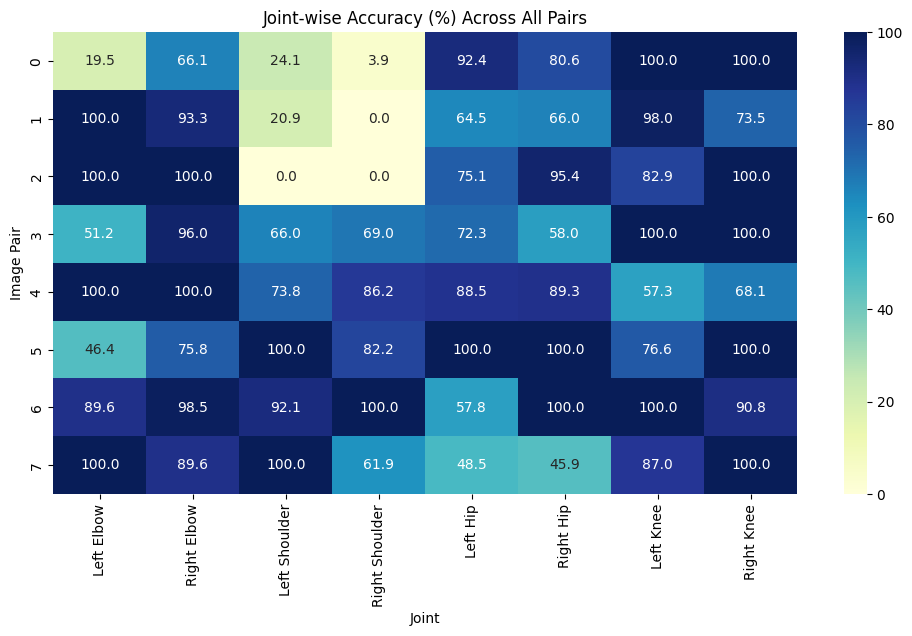

In [27]:
image_pairs = [
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TRAIN/Tree/00000073.jpg",
        "user": "/kaggle/input/trail/Tree1.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TEST/Downdog/00000077.jpg",
        "user": "/kaggle/input/trail/downdog1.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TEST/Downdog/00000077.jpg",
        "user": "/kaggle/input/trail/downdog2.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TEST/Downdog/00000077.jpg",
        "user": "/kaggle/input/trail/downdog3.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TRAIN/Tree/00000073.jpg",
        "user": "/kaggle/input/trail/tree2.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TRAIN/Goddess/00000104.jpeg",
        "user": "/kaggle/input/trail/goddness1.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TRAIN/Goddess/00000105.jpg",
        "user": "/kaggle/input/trail/goddness2.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TEST/Plank/00000018.jpg",
        "user": "/kaggle/input/trail/plank1.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TRAIN/Plank/00000156.jpg",
        "user": "/kaggle/input/trail/plank2.jpeg"
    },
    {
        "correct": "/kaggle/input/yoga-dataset/DATASET/TRAIN/Warrior/00000132.jpg",
        "user": "/kaggle/input/trail/warrior1.jpeg"
    },
   
]

all_scores, all_feedback, joint_accuracy_df = process_pose_pairs_with_metrics(image_pairs)